In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import LearningRateScheduler, ReduceLROnPlateau
from keras.applications.vgg16 import preprocess_input

import os
import cv2
from os import walk
import glob as gb
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
SEED = 1000
IMG_SIZE = 224
BATCH_SIZE = 24

TRAIN_DIR = 'C:/Users/Ankur Saha/Thesis/Caltech Bird/Train'
VALID_DIR = 'C:/Users/Ankur Saha/Thesis/Caltech Bird/Validation'
TEST_DIR = 'C:/Users/Ankur Saha/Thesis/Caltech Bird/Test'

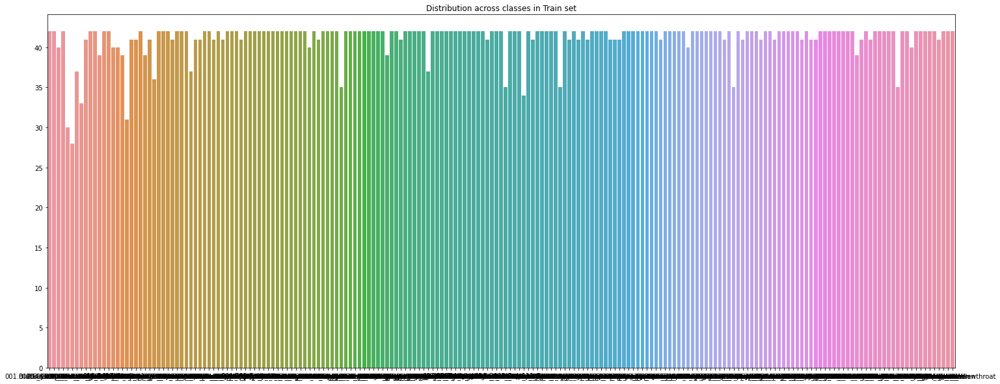

Total Train Examples = 8190


In [3]:
class_names = []
class_count = []
TRAIN_EXAMPLES = 0
for folder in  os.listdir(TRAIN_DIR) : 
    files = gb.glob(pathname= str( TRAIN_DIR + '//' + folder + '/*'))
    class_names.append(folder)
    class_count.append(len(files))
    TRAIN_EXAMPLES += len(files)

plt.figure(figsize=(25,10))    
sns.barplot(x = class_names, y=class_count).set_title("Distribution across classes in Train set")
plt.show()

print(f'Total Train Examples = {TRAIN_EXAMPLES}')

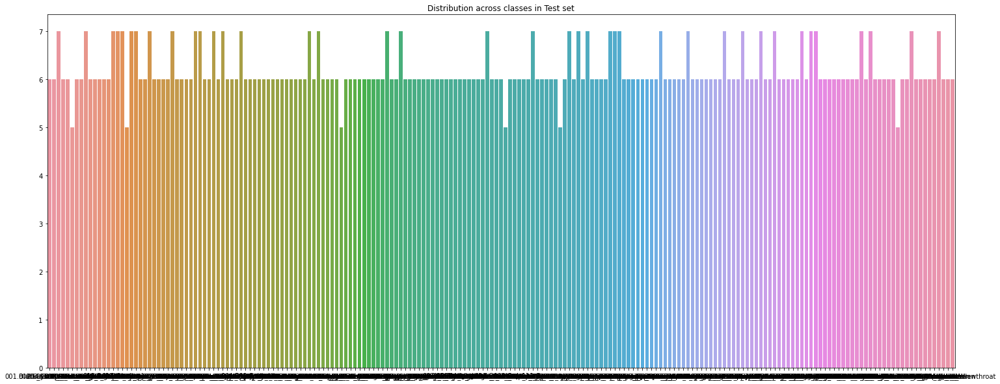

Total Test Examples = 1227


In [4]:
class_names = []
class_count = []
TEST_EXAMPLES = 0
for folder in  os.listdir(TEST_DIR) : 
    files = gb.glob(pathname= str( TEST_DIR + '//' + folder + '/*'))
    class_names.append(folder)
    class_count.append(len(files))
    TEST_EXAMPLES += len(files)

plt.figure(figsize=(25,10))     
sns.barplot(x = class_names, y=class_count).set_title("Distribution across classes in Test set")
plt.show()

print(f'Total Test Examples = {TEST_EXAMPLES}')

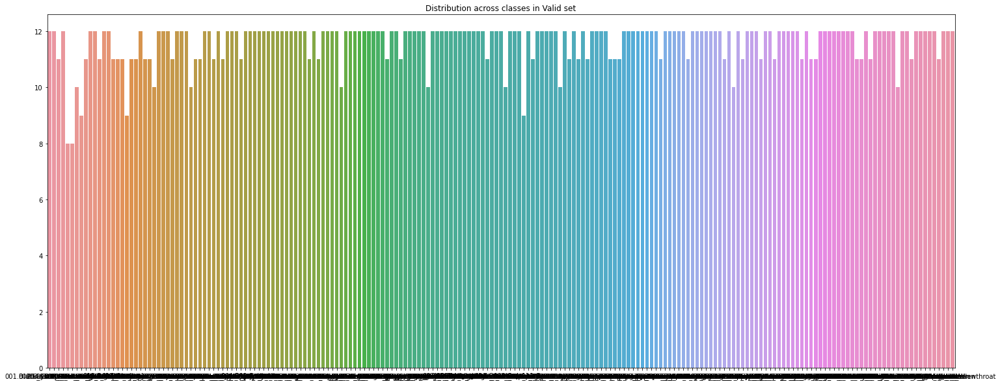

Total Validation Examples = 2311


In [5]:
class_names = []
class_count = []
VALIDATION_EXAMPLES = 0
for folder in  os.listdir(VALID_DIR) : 
    files = gb.glob(pathname= str( VALID_DIR + '//' + folder + '/*'))
    class_names.append(folder)
    class_count.append(len(files))
    VALIDATION_EXAMPLES += len(files)

plt.figure(figsize=(25,10))     
sns.barplot(x = class_names, y=class_count).set_title("Distribution across classes in Valid set")
plt.show()

print(f'Total Validation Examples = {VALIDATION_EXAMPLES}')

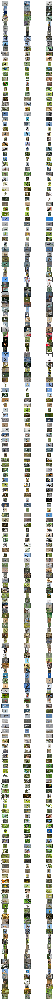

In [6]:
plt.figure(figsize=(20,300))
i=0
for c in os.listdir(TRAIN_DIR):  
    path = os.path.join(TRAIN_DIR,c)
    for img in os.listdir(path):
        img_array = cv2.cvtColor(cv2.imread(os.path.join(path,img)), cv2.COLOR_BGR2RGB) 
        plt.subplot(200,3,i+1)
        plt.imshow(img_array)
        if i%3 == 0:
            plt.ylabel(c)
        plt.xticks([])
        plt.yticks([])
        i += 1
        if i%3 == 0:
            break

plt.tight_layout()        
plt.show() 

In [7]:
train_gen = ImageDataGenerator(
    
    featurewise_center=False,
    
    samplewise_center=False,
    
    featurewise_std_normalization=False,
    
    samplewise_std_normalization=False,
    
    zca_whitening=False,
    
    zca_epsilon=1e-06,
    
    rotation_range=0.3,
    
    width_shift_range=0.2,
    
    height_shift_range=0.2,
    
    shear_range=0.2,
    
    zoom_range=0.3,
    
    channel_shift_range=0.,
    
    fill_mode='nearest',
    
    cval=0.,
    
    horizontal_flip=True,
    
    vertical_flip=True,
    
    rescale=None,
    
    preprocessing_function=tf.keras.applications.resnet50.preprocess_input,
    
    data_format=None,
    
    
    validation_split=0.0,
    
    dtype=tf.float32,
)

test_gen = ImageDataGenerator(
    preprocessing_function= tf.keras.applications.resnet50.preprocess_input, 
    dtype=tf.float32
)

In [8]:
train_batch = train_gen.flow_from_directory(
    directory = TRAIN_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'sparse',
    seed = SEED
)

Found 8190 images belonging to 199 classes.


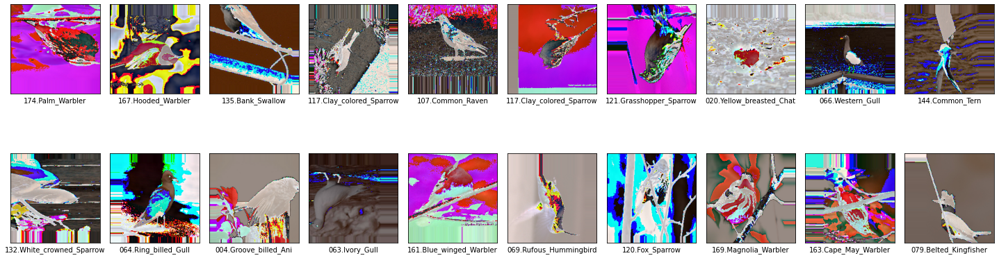

In [9]:
imgs, labels = next(train_batch)
i = 0
plt.figure(figsize=(20,7))
for img, label in zip(imgs, labels):
    plt.subplot(2,10,i+1)
    plt.imshow(img.astype('uint8'))
    plt.xticks([])
    plt.yticks([])
    plt.xlabel(class_names[label.astype('int32')])
    i+=1
    if i == 20:
        break
        
plt.tight_layout()
plt.show()

In [10]:
test_batch = test_gen.flow_from_directory(
    directory = TEST_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'sparse',
    seed = SEED
)

Found 1227 images belonging to 199 classes.


In [11]:
valid_batch = train_gen.flow_from_directory(
    directory = VALID_DIR,
    target_size = (IMG_SIZE,IMG_SIZE),
    batch_size = BATCH_SIZE,
    class_mode = 'sparse',
    seed = SEED
)

Found 2311 images belonging to 199 classes.


In [12]:
def identity_block(X, filters):
    f1, f2, f3 = filters
    X_copy = X
    
    
    X = layers.Conv2D(filters=f1, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X)
    
    
    X = layers.Conv2D(filters=f2, kernel_size=(3,3), strides=(1,1), padding='same')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    
   
    X = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    
   
    X = layers.Add()([X, X_copy])
    X = layers.Activation('relu')(X)
    
    return X

In [13]:
def conv_blocks(X, filters, s=2):
    f1, f2, f3 = filters
    X_copy = X
    
    
    X = layers.Conv2D(filters=f1, kernel_size=(1,1), strides=(s,s), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X)
    
    
    X = layers.Conv2D(filters=f2, kernel_size=(3,3), strides=(1,1), padding='same')(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    
    
    X = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(1,1), padding='valid')(X)
    X = layers.BatchNormalization(axis=3)(X)
    
    
    X_copy = layers.Conv2D(filters=f3, kernel_size=(1,1), strides=(s,s), padding='valid')(X_copy)
    X_copy = layers.BatchNormalization(axis=3)(X_copy)
    
    
    X = layers.Add()([X, X_copy])
    X = layers.Activation('relu')(X)
    
    return X

In [14]:
def ResNet50():
    X_input = keras.Input((IMG_SIZE, IMG_SIZE, 3))
    X = layers.ZeroPadding2D((3,3))(X_input)
    
   
    X = layers.Conv2D(64, (7,7), strides=(2,2))(X)
    X = layers.BatchNormalization(axis=3)(X)
    X = layers.Activation('relu')(X) 
    X = layers.MaxPooling2D((3,3), strides=(2,2))(X)
    
   
    X = conv_blocks(X, filters=[64,64,256], s=1)
    X = identity_block(X, filters=[64,64,256])
    X = identity_block(X, filters=[64,64,256])
    
   
    X = conv_blocks(X, filters=[128,128,512], s=2)
    X = identity_block(X, filters=[128,128,512])
    X = identity_block(X, filters=[128,128,512])
    X = identity_block(X, filters=[128,128,512])
    
    
    X = conv_blocks(X, filters=[256,256,1024], s=2)
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    X = identity_block(X, filters=[256,256,1024])
    
    
    X = conv_blocks(X, filters=[512,512,2048], s=2)
    X = identity_block(X, filters=[512,512,2048])
    X = identity_block(X, filters=[512,512,2048])
    
    
    X = layers.AveragePooling2D((2,2))(X)
    X = layers.Flatten()(X)
    X = layers.Dense(199, activation='softmax', kernel_initializer='he_normal')(X)
    
    model = keras.Model(inputs=X_input, outputs=X, name='ResNet50')
    
    return model

In [15]:
model = ResNet50()
model.summary()

Model: "ResNet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['input_1[0][0]']                
                                                                                                  
 conv2d (Conv2D)                (None, 112, 112, 64  9472        ['zero_padding2d[0][0]']         
                                )                                                                 
                                                                                           

In [16]:
def lr_schedule(epoch):
    lr = 1e-3
    if epoch > 40:
        lr *= 0.5e-3
    elif epoch > 30:
        lr *= 1e-3
    elif epoch > 20:
        lr *= 1e-2
    elif epoch > 10:
        lr *= 1e-1
    print('Learning rate: ', lr)
    return lr
lr_scheduler = LearningRateScheduler(lr_schedule)

In [17]:
model.compile(
    optimizer=keras.optimizers.Adam(lr=lr_schedule(0)), 
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

Learning rate:  0.001


C:\Users\Ankur Saha\.conda\envs\CVPR\lib\site-packages\keras\optimizer_v2\adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [18]:
h = model.fit(train_batch, 
              epochs=50,
              steps_per_epoch = TRAIN_EXAMPLES // BATCH_SIZE,
              validation_data = valid_batch,
              validation_steps = VALIDATION_EXAMPLES // BATCH_SIZE,
              callbacks=lr_scheduler,
              verbose=2
             )

Learning rate:  0.001
Epoch 1/50
341/341 - 97s - loss: 6.0407 - accuracy: 0.0107 - val_loss: 5.1429 - val_accuracy: 0.0113 - lr: 0.0010 - 97s/epoch - 285ms/step
Learning rate:  0.001
Epoch 2/50
341/341 - 83s - loss: 5.0405 - accuracy: 0.0145 - val_loss: 5.1425 - val_accuracy: 0.0174 - lr: 0.0010 - 83s/epoch - 243ms/step
Learning rate:  0.001
Epoch 3/50
341/341 - 83s - loss: 4.9422 - accuracy: 0.0195 - val_loss: 4.9411 - val_accuracy: 0.0169 - lr: 0.0010 - 83s/epoch - 242ms/step
Learning rate:  0.001
Epoch 4/50
341/341 - 83s - loss: 4.8639 - accuracy: 0.0174 - val_loss: 4.9345 - val_accuracy: 0.0174 - lr: 0.0010 - 83s/epoch - 243ms/step
Learning rate:  0.001
Epoch 5/50
341/341 - 85s - loss: 4.7635 - accuracy: 0.0269 - val_loss: 4.8120 - val_accuracy: 0.0317 - lr: 0.0010 - 85s/epoch - 250ms/step
Learning rate:  0.001
Epoch 6/50
341/341 - 83s - loss: 4.6503 - accuracy: 0.0344 - val_loss: 4.6615 - val_accuracy: 0.0386 - lr: 0.0010 - 83s/epoch - 243ms/step
Learning rate:  0.001
Epoch 7/50
3